# Sprint19課題 データセット作成

In [1]:
import os, sys
import re

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

import tensorflow as tf
import keras

from keras import models, layers
from keras.preprocessing import image
from keras.utils import to_categorical
from keras import backend as K

# 画像
from PIL import Image
import cv2

# XMLファイルの編集
import xml.etree.ElementTree as ET

Using TensorFlow backend.


## 【問題1】自作データセットでの分類の学習

自作のデータセットに対して分類問題を解くこと。（任意の実装を使用する）

In [2]:
# データセットの準備
path = "./pic"
class_list = ["cat", "dog"]
dog_img_array = np.empty((0, 224, 224, 3))
cat_img_array = np.empty((0, 224, 224, 3))

In [3]:
for class_name in class_list:
    img_path = os.path.join(path, class_name)
    img_list = os.listdir(img_path)
    
    for img in img_list:
        if re.search("dog", img):
            dog_img = Image.open(os.path.join(img_path, img))
            dog_img = np.asarray(dog_img)
            dog_img = cv2.resize(dog_img, dsize=None, fx=224/dog_img.shape[1], fy=224/dog_img.shape[0])[np.newaxis, :, :, :]
            dog_img_array = np.concatenate([dog_img_array, dog_img], axis=0)
    
        if re.search("cat", img):
            cat_img = Image.open(os.path.join(img_path, img))
            cat_img = np.asarray(cat_img)
            cat_img = cv2.resize(cat_img, dsize=None, fx=224/cat_img.shape[1], fy=224/cat_img.shape[0])[np.newaxis, :,:,:]
            cat_img_array = np.concatenate([cat_img_array, cat_img], axis=0)

In [4]:
# 特徴量の形状
dog_img_array.shape, cat_img_array.shape

((10, 224, 224, 3), (10, 224, 224, 3))

In [5]:
# 正規化
cat_img_array = cat_img_array.astype("float32")/255
dog_img_array = dog_img_array.astype("float32") /255

In [6]:
# 正解ラベル（0 : cat、1 : dog）
cat_labels = np.zeros(cat_img_array.shape[0]).astype("int")
dog_labels = np.ones(dog_img_array.shape[0]).astype("int")

In [7]:
X = np.concatenate((cat_img_array, dog_img_array), axis=0)
y = np.concatenate((cat_labels, dog_labels))

X.shape, y.shape

((20, 224, 224, 3), (20,))

In [8]:
# 学習用データ、検証用データの生成
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [9]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=0)

In [10]:
# データの均衡度
np.unique(y_train, return_counts=True)

(array([0, 1]), array([5, 7]))

# モデルの生成

In [11]:
from keras.applications.vgg16 import VGG16
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten
from keras.optimizers import SGD

# VGG-16モデルの構造と重みをロード
# include_top=Falseによって、VGG16モデルから全結合層を削除
input_tensor = Input(shape=(224, 224, 3))
vgg16_model = VGG16(include_top=False, weights='imagenet', input_tensor=input_tensor)
    
# 全結合層の構築
top_model = Sequential()
top_model.add(Flatten(input_shape=vgg16_model.output_shape[1:]))
top_model.add(Dense(256))
top_model.add(Activation("relu"))
top_model.add(Dropout(0.5))
top_model.add(Dense(1))
top_model.add(Activation("sigmoid"))
    
# 全結合層を削除したVGG16モデルと上で自前で構築した全結合層を結合
model = Model(input=vgg16_model.input, output=top_model(vgg16_model.output))

# 14層目までのモデル重みを固定（VGG16のモデル重みを用いる）
for layer in model.layers[:15]:
        layer.trainable = False

# モデルのコンパイル
model.compile(loss='binary_crossentropy',
              optimizer=SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True),
              metrics=['accuracy'])

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


/Users/makintosh/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:21: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("se...)`


In [12]:
# 前提条件
epochs = 15
batch_size = 4

In [13]:
# 学習
history = model.fit(X_train, y_train, epochs=epochs, batch_size=4, validation_data=(X_val, y_val))

Instructions for updating:
Use tf.cast instead.
Train on 12 samples, validate on 4 samples
Epoch 1/15
12/12 [==============================] - 5s 385ms/step - loss: 0.9673 - acc: 0.5833 - val_loss: 0.6019 - val_acc: 0.7500
Epoch 2/15
12/12 [==============================] - 4s 353ms/step - loss: 0.6051 - acc: 0.7500 - val_loss: 0.9664 - val_acc: 0.2500
Epoch 3/15
12/12 [==============================] - 4s 368ms/step - loss: 0.2168 - acc: 0.9167 - val_loss: 1.6062 - val_acc: 0.2500
Epoch 4/15
12/12 [==============================] - 4s 322ms/step - loss: 0.2157 - acc: 0.9167 - val_loss: 1.9850 - val_acc: 0.2500
Epoch 5/15
12/12 [==============================] - 4s 356ms/step - loss: 0.8537 - acc: 0.5000 - val_loss: 0.7946 - val_acc: 0.2500
Epoch 6/15
12/12 [==============================] - 4s 350ms/step - loss: 0.2840 - acc: 0.8333 - val_loss: 0.2776 - val_acc: 1.0000
Epoch 7/15
12/12 [==============================] - 4s 328ms/step - loss: 0.2023 - acc: 0.8333 - val_loss: 0.3157 - v

In [14]:
def show_learning_curve(history):
    """
    学習曲線
    
    Parameters
    ------------
    history : dict
        kerasによる学習時の損失
    
    """
    history_dict = history.history
    
    loss = history_dict["loss"]
    
    epoch = range(1, len(loss)+1)
    
    if "val_loss" in history_dict.keys():
        val_loss = history_dict["val_loss"]
        plt.plot(epoch, val_loss, "b", label="Val Loss")

    plt.plot(epoch, loss, "bo", label="Train Loss")
    plt.title("Training and validation Loss")
    plt.xlabel("epochs")
    plt.ylabel("loss")
    plt.legend()
    plt.show()

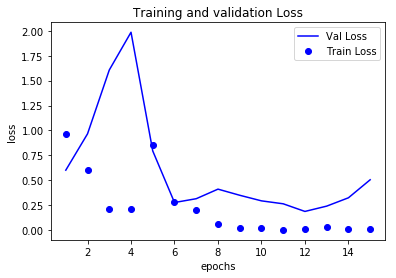

In [15]:
# 学習曲線
show_learning_curve(history)

In [16]:
# 予測
y_pred_prob = model.predict(X_test)
y_pred_prob

array([[0.91884136],
       [0.9555217 ],
       [0.9832932 ],
       [0.19784358]], dtype=float32)

In [17]:
# 評価
y_pred = np.where(y_pred_prob>=0.5, 1, 0)
accuracy_score(y_test, y_pred)

0.75

In [18]:
K.clear_session()

## 【問題2】分類データセットに対するデータ拡張

データ拡張（Data Augmentation）を行うこと。

### データ拡張のためのライブラリ

データ拡張にはalbumentationsなどがある。

[albu/albumentations: fast image augmentation library and easy to use wrapper around other libraries](https://github.com/albu/albumentations)

また、Kerasを使う場合はImageDataGeneratorも便利である。


### データ拡張の効果の調査

データ拡張には様々な方法がある。
今回のタスクにおいて各手法がどう効果があるかを実験・考察すること。

#### データ拡張にalbumentationsを用いる

In [19]:
from urllib.request import urlopen
from albumentations import (
    HorizontalFlip, IAAPerspective, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue,
    IAAAdditiveGaussianNoise, GaussNoise, MotionBlur, MedianBlur, RandomBrightnessContrast, IAAPiecewiseAffine,
    IAASharpen, IAAEmboss, Flip, OneOf, Compose
)

In [20]:
# 猫エンジニア
path = "./pic/cat/cat1.jpg"
sample_image = Image.open(path)
sample_image = np.asarray(sample_image)
sample_image.shape

(1019, 1600, 3)

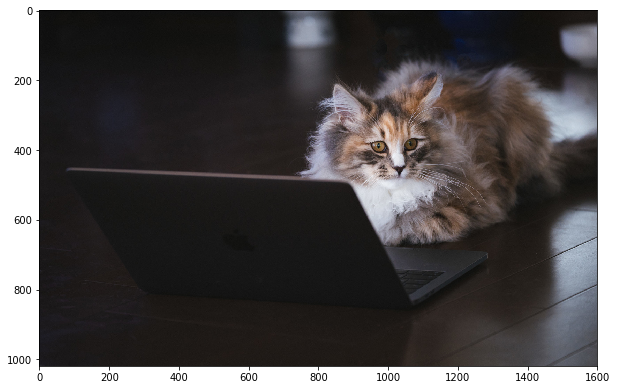

In [21]:
plt.figure(figsize=(10, 10))
plt.imshow(sample_image)
plt.show()

In [22]:
def augment_and_show(aug, image):
    image = aug(image=image)['image']
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

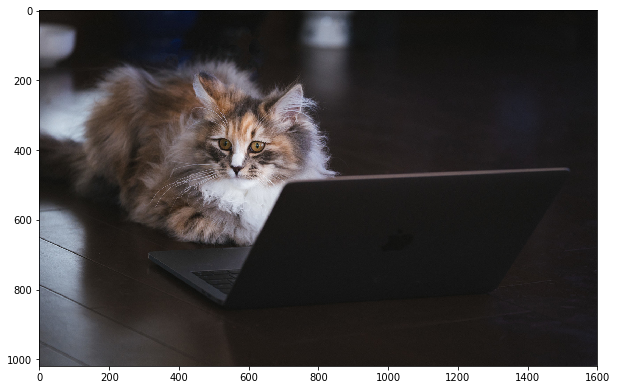

In [23]:
aug = HorizontalFlip(p=1)
augment_and_show(aug, sample_image)

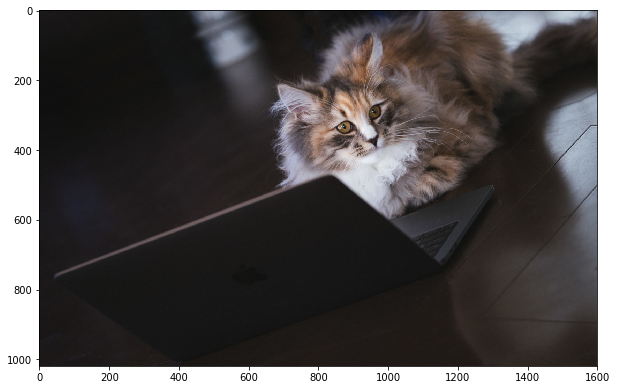

In [24]:
aug = ShiftScaleRotate(p=1)
augment_and_show(aug, sample_image)

### データ拡張にImageDataGeneratorを用いる

In [25]:
# 前提条件
epochs = 30
batch_size = 4
mean = 0
stddev = 1
seed = 10

In [26]:
from keras.applications.vgg16 import VGG16
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten
from keras.optimizers import SGD

# VGG-16モデルの構造と重みをロード
# include_top=Falseによって、VGG16モデルから全結合層を削除
input_tensor = Input(shape=(224, 224, 3))
vgg16_model = VGG16(include_top=False, weights='imagenet', input_tensor=input_tensor)
    
# 全結合層の構築
top_model = Sequential()
top_model.add(Flatten(input_shape=vgg16_model.output_shape[1:]))
top_model.add(Dense(256))
top_model.add(Activation("relu"))
top_model.add(Dropout(0.5))
top_model.add(Dense(1))
top_model.add(Activation("sigmoid"))
    
# 全結合層を削除したVGG16モデルと上で自前で構築した全結合層を結合
model = Model(input=vgg16_model.input, output=top_model(vgg16_model.output))

# 図3における14層目までのモデル重みを固定（VGG16のモデル重みを用いる）
for layer in model.layers[:15]:
        layer.trainable = False

# モデルのコンパイル
model.compile(loss='binary_crossentropy',
              optimizer=SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True),
              metrics=['accuracy'])

/Users/makintosh/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:21: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("se...)`


In [27]:
datagen = image.ImageDataGenerator(featurewise_center=True,
                                  samplewise_center=False,
                                  featurewise_std_normalization=True,
                                  samplewise_std_normalization=False,
                                  zca_epsilon=1e-6,
                                  zca_whitening=False,
                                  rotation_range=20,
                                  width_shift_range=0.2,
                                  height_shift_range=0.2,
                                  shear_range=1,
                                  zoom_range=1,
                                  channel_shift_range=0,
                                  fill_mode="nearest",
                                  cval=0,
                                  horizontal_flip=True,
                                  vertical_flip=False,
                                  rescale=None,
                                  preprocessing_function=None,
                                  data_format="channels_last",
                                  validation_split=0)

In [28]:
datagen.fit(X_train)

In [29]:
history_aug = model.fit_generator(datagen.flow(X_train, y_train, batch_size=batch_size),
                   steps_per_epoch=len(X_train)/batch_size, epochs=epochs, validation_data=(X_val, y_val), verbose=1)

Epoch 1/30
3/3 [==============================] - 5s 2s/step - loss: 1.1191 - acc: 0.5000 - val_loss: 1.7442 - val_acc: 0.2500
Epoch 2/30
3/3 [==============================] - 4s 1s/step - loss: 1.0220 - acc: 0.5833 - val_loss: 0.7380 - val_acc: 0.5000
Epoch 3/30
3/3 [==============================] - 4s 1s/step - loss: 1.1625 - acc: 0.4167 - val_loss: 0.6685 - val_acc: 0.7500
Epoch 4/30
3/3 [==============================] - 4s 1s/step - loss: 1.3180 - acc: 0.5000 - val_loss: 0.5470 - val_acc: 0.7500
Epoch 5/30
3/3 [==============================] - 4s 1s/step - loss: 0.5130 - acc: 0.7500 - val_loss: 0.7648 - val_acc: 0.2500
Epoch 6/30
3/3 [==============================] - 5s 2s/step - loss: 1.3748 - acc: 0.5833 - val_loss: 2.6602 - val_acc: 0.2500
Epoch 7/30
3/3 [==============================] - 4s 1s/step - loss: 2.0816 - acc: 0.5833 - val_loss: 1.0966 - val_acc: 0.2500
Epoch 8/30
3/3 [==============================] - 4s 1s/step - loss: 0.7949 - acc: 0.4167 - val_loss: 0.5548 - 

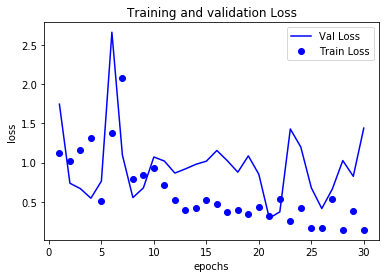

In [30]:
show_learning_curve(history_aug)

### 効果の検証

事例として、rotation_rangeを[0, 15, 30, 60, 90]の５パターン試し、モデルの学習、および精度に与える影響を確認する。

### rotation_range = 0

In [32]:
from keras.applications.vgg16 import VGG16
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten
from keras.optimizers import SGD

# VGG-16モデルの構造と重みをロード
# include_top=Falseによって、VGG16モデルから全結合層を削除
input_tensor = Input(shape=(224, 224, 3))
vgg16_model = VGG16(include_top=False, weights='imagenet', input_tensor=input_tensor)
    
# 全結合層の構築
top_model = Sequential()
top_model.add(Flatten(input_shape=vgg16_model.output_shape[1:]))
top_model.add(Dense(256))
top_model.add(Activation("relu"))
top_model.add(Dropout(0.5))
top_model.add(Dense(1))
top_model.add(Activation("sigmoid"))
    
# 全結合層を削除したVGG16モデルと上で自前で構築した全結合層を結合
model = Model(input=vgg16_model.input, output=top_model(vgg16_model.output))

# 図3における14層目までのモデル重みを固定（VGG16のモデル重みを用いる）
for layer in model.layers[:15]:
        layer.trainable = False

# モデルのコンパイル
model.compile(loss='binary_crossentropy',
              optimizer=SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True),
              metrics=['accuracy'])

/Users/makintosh/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:21: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("se...)`


rotation :  0
accuracy_score : 0.75


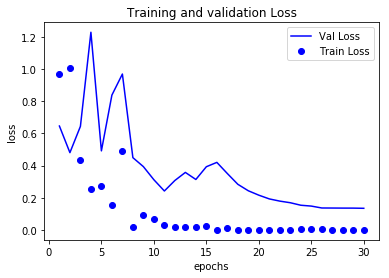

In [33]:
rotation = 0

print("rotation : ", rotation)
datagen = image.ImageDataGenerator(rotation_range=rotation)
datagen.fit(X_train)
keras.initializers.RandomNormal(mean=mean, stddev=stddev, seed=seed)

history = model.fit_generator(datagen.flow(X_train, y_train, batch_size=batch_size),
                             steps_per_epoch=len(X_train)/batch_size, epochs=epochs, validation_data=(X_val, y_val), verbose=0)
y_pred_prob = model.predict(X_test)
y_pred = np.where(y_pred_prob>0.5, 1, 0)
print("accuracy_score : {}".format(accuracy_score(y_test, y_pred)))
show_learning_curve(history)
K.clear_session()

### rotation_range = 15

In [41]:
from keras.applications.vgg16 import VGG16
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten
from keras.optimizers import SGD

# VGG-16モデルの構造と重みをロード
# include_top=Falseによって、VGG16モデルから全結合層を削除
input_tensor = Input(shape=(224, 224, 3))
vgg16_model = VGG16(include_top=False, weights='imagenet', input_tensor=input_tensor)
    
# 全結合層の構築
top_model = Sequential()
top_model.add(Flatten(input_shape=vgg16_model.output_shape[1:]))
top_model.add(Dense(256))
top_model.add(Activation("relu"))
top_model.add(Dropout(0.5))
top_model.add(Dense(1))
top_model.add(Activation("sigmoid"))
    
# 全結合層を削除したVGG16モデルと上で自前で構築した全結合層を結合
model = Model(input=vgg16_model.input, output=top_model(vgg16_model.output))

# 図3における14層目までのモデル重みを固定（VGG16のモデル重みを用いる）
for layer in model.layers[:15]:
        layer.trainable = False

# モデルのコンパイル
model.compile(loss='binary_crossentropy',
              optimizer=SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True),
              metrics=['accuracy'])

/Users/makintosh/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:21: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("se...)`


rotation :  15
accuracy_score : 0.75


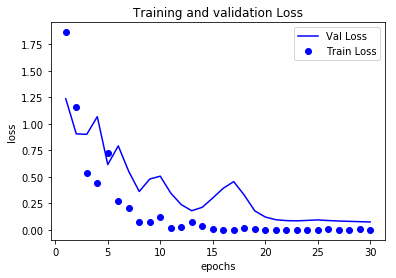

In [42]:
rotation = 15

print("rotation : ", rotation)
datagen = image.ImageDataGenerator(rotation_range=rotation)
datagen.fit(X_train)
keras.initializers.RandomNormal(mean=mean, stddev=stddev, seed=seed)

history = model.fit_generator(datagen.flow(X_train, y_train, batch_size=batch_size),
                             steps_per_epoch=len(X_train)/batch_size, epochs=epochs, validation_data=(X_val, y_val), verbose=0)
y_pred_prob = model.predict(X_test)
y_pred = np.where(y_pred_prob>0.5, 1, 0)
print("accuracy_score : {}".format(accuracy_score(y_test, y_pred)))
show_learning_curve(history)
K.clear_session()

### rotation_range = 30

In [35]:
from keras.applications.vgg16 import VGG16
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten
from keras.optimizers import SGD

# VGG-16モデルの構造と重みをロード
# include_top=Falseによって、VGG16モデルから全結合層を削除
input_tensor = Input(shape=(224, 224, 3))
vgg16_model = VGG16(include_top=False, weights='imagenet', input_tensor=input_tensor)
    
# 全結合層の構築
top_model = Sequential()
top_model.add(Flatten(input_shape=vgg16_model.output_shape[1:]))
top_model.add(Dense(256))
top_model.add(Activation("relu"))
top_model.add(Dropout(0.5))
top_model.add(Dense(1))
top_model.add(Activation("sigmoid"))
    
# 全結合層を削除したVGG16モデルと上で自前で構築した全結合層を結合
model = Model(input=vgg16_model.input, output=top_model(vgg16_model.output))

# 図3における14層目までのモデル重みを固定（VGG16のモデル重みを用いる）
for layer in model.layers[:15]:
        layer.trainable = False

# モデルのコンパイル
model.compile(loss='binary_crossentropy',
              optimizer=SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True),
              metrics=['accuracy'])

/Users/makintosh/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:21: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("se...)`


rotation :  30
accuracy_score : 0.5


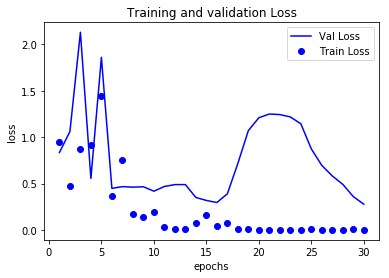

In [36]:
rotation = 30

print("rotation : ", rotation)
datagen = image.ImageDataGenerator(rotation_range=rotation)
datagen.fit(X_train)
keras.initializers.RandomNormal(mean=mean, stddev=stddev, seed=seed)

history = model.fit_generator(datagen.flow(X_train, y_train, batch_size=batch_size),
                             steps_per_epoch=len(X_train)/batch_size, epochs=epochs, validation_data=(X_val, y_val), verbose=0)
y_pred_prob = model.predict(X_test)
y_pred = np.where(y_pred_prob>0.5, 1, 0)
print("accuracy_score : {}".format(accuracy_score(y_test, y_pred)))
show_learning_curve(history)
K.clear_session()

#### rotation_range = 60

In [37]:
from keras.applications.vgg16 import VGG16
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten
from keras.optimizers import SGD

# VGG-16モデルの構造と重みをロード
# include_top=Falseによって、VGG16モデルから全結合層を削除
input_tensor = Input(shape=(224, 224, 3))
vgg16_model = VGG16(include_top=False, weights='imagenet', input_tensor=input_tensor)
    
# 全結合層の構築
top_model = Sequential()
top_model.add(Flatten(input_shape=vgg16_model.output_shape[1:]))
top_model.add(Dense(256))
top_model.add(Activation("relu"))
top_model.add(Dropout(0.5))
top_model.add(Dense(1))
top_model.add(Activation("sigmoid"))
    
# 全結合層を削除したVGG16モデルと上で自前で構築した全結合層を結合
model = Model(input=vgg16_model.input, output=top_model(vgg16_model.output))

# 図3における14層目までのモデル重みを固定（VGG16のモデル重みを用いる）
for layer in model.layers[:15]:
        layer.trainable = False

# モデルのコンパイル
model.compile(loss='binary_crossentropy',
              optimizer=SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True),
              metrics=['accuracy'])

/Users/makintosh/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:21: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("se...)`


rotation :  60
accuracy_score : 0.75


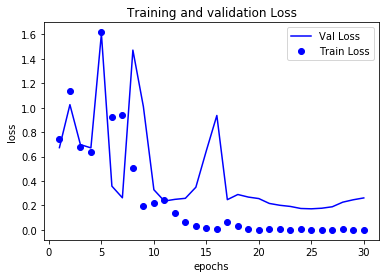

In [38]:
rotation = 60

print("rotation : ", rotation)
datagen = image.ImageDataGenerator(rotation_range=rotation)
datagen.fit(X_train)
keras.initializers.RandomNormal(mean=mean, stddev=stddev, seed=seed)

history = model.fit_generator(datagen.flow(X_train, y_train, batch_size=batch_size),
                             steps_per_epoch=len(X_train)/batch_size, epochs=epochs, validation_data=(X_val, y_val), verbose=0)
y_pred_prob = model.predict(X_test)
y_pred = np.where(y_pred_prob>0.5, 1, 0)
print("accuracy_score : {}".format(accuracy_score(y_test, y_pred)))
show_learning_curve(history)
K.clear_session()

### rotation_range = 90

In [39]:
from keras.applications.vgg16 import VGG16
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten
from keras.optimizers import SGD

# VGG-16モデルの構造と重みをロード
# include_top=Falseによって、VGG16モデルから全結合層を削除
input_tensor = Input(shape=(224, 224, 3))
vgg16_model = VGG16(include_top=False, weights='imagenet', input_tensor=input_tensor)
    
# 全結合層の構築
top_model = Sequential()
top_model.add(Flatten(input_shape=vgg16_model.output_shape[1:]))
top_model.add(Dense(256))
top_model.add(Activation("relu"))
top_model.add(Dropout(0.5))
top_model.add(Dense(1))
top_model.add(Activation("sigmoid"))
    
# 全結合層を削除したVGG16モデルと上で自前で構築した全結合層を結合
model = Model(input=vgg16_model.input, output=top_model(vgg16_model.output))

# 図3における14層目までのモデル重みを固定（VGG16のモデル重みを用いる）
for layer in model.layers[:15]:
        layer.trainable = False

# モデルのコンパイル
model.compile(loss='binary_crossentropy',
              optimizer=SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True),
              metrics=['accuracy'])

/Users/makintosh/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:21: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("se...)`


rotation :  90
accuracy_score : 0.75


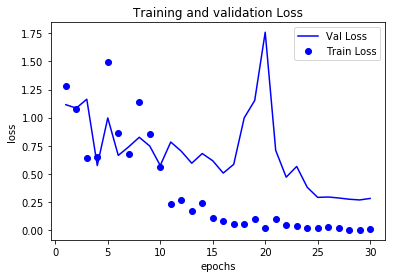

In [40]:
rotation = 90

print("rotation : ", rotation)
datagen = image.ImageDataGenerator(rotation_range=rotation)
datagen.fit(X_train)
keras.initializers.RandomNormal(mean=mean, stddev=stddev, seed=seed)

history = model.fit_generator(datagen.flow(X_train, y_train, batch_size=batch_size),
                             steps_per_epoch=len(X_train)/batch_size, epochs=epochs, validation_data=(X_val, y_val), verbose=0)
y_pred_prob = model.predict(X_test)
y_pred = np.where(y_pred_prob>0.5, 1, 0)
print("accuracy_score : {}".format(accuracy_score(y_test, y_pred)))
show_learning_curve(history)
K.clear_session()

### 考察
- rotation_range = 30のケースを除き、accuracyは0.75で横並びとなった。（サンプル数が少ないため、精度に関しては評価し難い）

- 学習曲線におけるval_lossの推移を比較すると、rotation_range = 0のケースに比して、rotation_range = 15のケースが最も効率的に損失が低下しており、汎化性能向上に好ましい影響を与えている。

- データ拡張に関しては、パラメータを過度に大きくすると、元の画像との類似度が大幅に低下し（＝特徴量が大幅に変化し）、望ましくない影響があると理解した。

## 【問題3】物体検出データセットの用意
次に、物体検出を行う。

バウンディングボックスのアノテーションを行い物体検出のためのデータセットを作成すること。

### アノテーションのためのツール

アノテーションツールにはLabelImgなどがある。

[tzutalin/labelImg: LabelImg is a graphical image annotation tool and label object bounding boxes in images](https://github.com/tzutalin/labelImg)

#### Labellmg概要

- LabelImgは、画像イメージのアノテーションツール。

- Labellmgはgraphical interfaceのために、PythonとQtを用いて記述されている。

- アノテーションされたファイルは、ImageNetで用いられるPASCAL VOC formatのXMLファイル形式で保存され、"YOLO"のフォーマットもカバーしている。

In [43]:
os.chdir("./labelImg")

In [44]:
%run -i labelImg.py

#### アノテーションを実施

In [45]:
os.chdir("../")

cwd = os.getcwd()

os.listdir(cwd+"/pic_labeled/cat")

['.DS_Store',
 'cat1.xml',
 'cat2.xml',
 'cat3.xml',
 'cat7.xml',
 'cat6.xml',
 'cat10.xml',
 'cat4.xml',
 'cat5.xml',
 'cat8.xml',
 'cat9.xml']

In [46]:
path = os.path.join(cwd, "pic_labeled/cat/cat1.xml")

In [47]:
sample_labeled_data = open(path, "r")
print(sample_labeled_data)

<_io.TextIOWrapper name='/Users/makintosh/diveintocode-term2/sprint19/pic_labeled/cat/cat1.xml' mode='r' encoding='UTF-8'>


In [48]:
sample_txt = ""
sample_txt += "check"
sample_txt

'check'

#### Pythonを用いてXMLファイルを操作する

In [49]:
# XMLファイルを読み込む
tree = ET.parse(path)

# path
path_text = tree.find("path").text
print("path : ", path_text)

# width
width_text = tree.find("size/width").text
print("width_text : ",width_text)

# x_min
x_min_text = tree.find("object/bndbox/xmin").text
print("x_min : ", x_min_text)

#
path_bndbox = "object/bndbox"
positions = ["xmin", "ymin", "xmax", "ymax"]

for position in positions:
    position_text = tree.find(os.path.join(path_bndbox, position)).text
    print(position, ":" ,position_text)

path :  /Users/makintosh/diveintocode-term2/sprint19/pic/cat/cat1.jpg
width_text :  1600
x_min :  713
xmin : 713
ymin : 105
xmax : 1518
ymax : 674


In [50]:
os.getcwd()

'/Users/makintosh/diveintocode-term2/sprint19'

In [51]:
pic_path = "./pic_labeled"
txt_path = "./YOLO/model_data/train.txt"
classes = ["cat", "dog"]

In [52]:
import os, sys
import xml.etree.ElementTree as ET

def create_train_text(pic_path, txt_path, classes):
    """
    XMLファイル（アノテーション済の画像データ）からYOLOの学習に用いるテキストファイル（画像保存先パス&特徴量）を作成する
    各データのアノテーションの位置情報を取得する
    
    Parameters
    ------------
    pic_path : str
        アノテーション済データ格納先（サブフォルダ）の親フォルダのパス
    
    txt_path : str
        情報を書き込むテキストファイルのパス
    
    classes : list
        正解ラベル
    
    Return
    -------------
    annotations : list
        各データの位置情報を取得する
    
    """
    # テキストファイルを開く
    file = open(txt_path, "w")
    
    # XMLファイルから取得する情報
    path_bndbox = "object/bndbox"
    positions = ["xmin", "ymin", "xmax", "ymax"]
    
    # 各データのbounding_boxの座標情報を格納するリスト
    annotations = []
    
    # 学習に用いる画像データの情報（path、座標、クラス番号）を抽出し、テキストファイルに書き込む
    count_class = -1
    
    for class_name in classes:
        count_class  += 1

        path_pics_folder = os.path.join(pic_path, class_name) # 画像データの格納先
        #print("path_pics_folder:", path_pics_folder)
        pics_list = os.listdir(path_pics_folder) # 画像データのリスト
        
        for pic in pics_list:
            if pic != ".DS_Store":
                pic_info = ""
                
                path_pic = os.path.join(path_pics_folder, pic)
                tree = ET.parse(path_pic)
                
                # 画像データのパスを取得する
                path_text = tree.find("path").text
                pic_info = pic_info + path_text + " "
                
                # アノテーション範囲の座標情報を取得する
                posi_info = []
                
                for position in positions:
                    position_text = tree.find(os.path.join(path_bndbox, position)).text
                    pic_info = pic_info + position_text + ","
                    posi_info.append(float(position_text))
                
                # クラス情報を取得する
                pic_info = pic_info + str(count_class) + "\n" 
                
                # 画像の情報をtrain.txtに書き込む
                #file.write(pic_info) 
                
                annotations.append({"path":path_text, "bboxes": posi_info, "category_id":count_class})
    
    file.close()
    
    return annotations

In [53]:
# テキストファイルを作成する
annotations_info = create_train_text(pic_path, txt_path, classes)

In [54]:
annotations_info[0]

{'path': '/Users/makintosh/diveintocode-term2/sprint19/pic/cat/cat1.jpg',
 'bboxes': [713.0, 105.0, 1518.0, 674.0],
 'category_id': 0}

- 作成したアノテーション済データセットの、①ファイル名、②バウンディングボックスの座標情報、③クラスをファイルに保持した。
- これを用いてバウンディングボックスを表示する。

## 【問題4】物体検出データセットに対するデータ拡張
データ拡張（Data Augmentation）を行うこと。

前述のalbumentationsはバウンディングボックスを合わせての加工が可能。（詳細はREADME.mdを参照）

物体検出の学習を行なうかどうかは任意とする。

#### albumentationsを用いて物体検知を行う

In [66]:
%matplotlib inline
from urllib.request import urlopen
import os

import numpy as np
import cv2
from matplotlib import pyplot as plt

from albumentations import (
    HorizontalFlip,
    VerticalFlip,
    Resize,
    CenterCrop,
    RandomCrop,
    Crop,
    Compose
)

In [57]:
def download_image(url):
    data = urlopen(url).read()
    data = np.frombuffer(data, np.uint8)
    image = cv2.imdecode(data, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [58]:
# Functions to visualize bounding boxes and class labels on an image. 
# Based on https://github.com/facebookresearch/Detectron/blob/master/detectron/utils/vis.py

BOX_COLOR = (255, 0, 0)
TEXT_COLOR = (255, 255, 255)


def visualize_bbox(img, bbox, class_id, class_idx_to_name, color=BOX_COLOR, thickness=2):
    x_min, y_min, w, h = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    class_name = class_idx_to_name[class_id]
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(img, class_name, (x_min, y_min - int(0.3 * text_height)), cv2.FONT_HERSHEY_SIMPLEX, 0.35,TEXT_COLOR, lineType=cv2.LINE_AA)
    return img


def visualize(annotations, category_id_to_name):
    img = annotations['image'].copy()
    for idx, bbox in enumerate(annotations['bboxes']):
        img = visualize_bbox(img, bbox, annotations['category_id'][idx], category_id_to_name)
    plt.figure(figsize=(12, 12))
    plt.imshow(img)

In [59]:
def get_aug(aug, min_area=0., min_visibility=0.):
    return Compose(aug, bbox_params={'format': 'coco', 'min_area': min_area, 'min_visibility': min_visibility, 'label_fields': ['category_id']})

In [60]:
image = download_image('http://images.cocodataset.org/train2017/000000386298.jpg')

In [61]:
# Annotations for image 386298 from COCO http://cocodataset.org/#explore?id=386298
annotations = {'image': image, 'bboxes': [[366.7, 80.84, 132.8, 181.84], [5.66, 138.95, 147.09, 164.88]], 'category_id': [18, 17]}
category_id_to_name = {17: 'cat', 18: 'dog'}

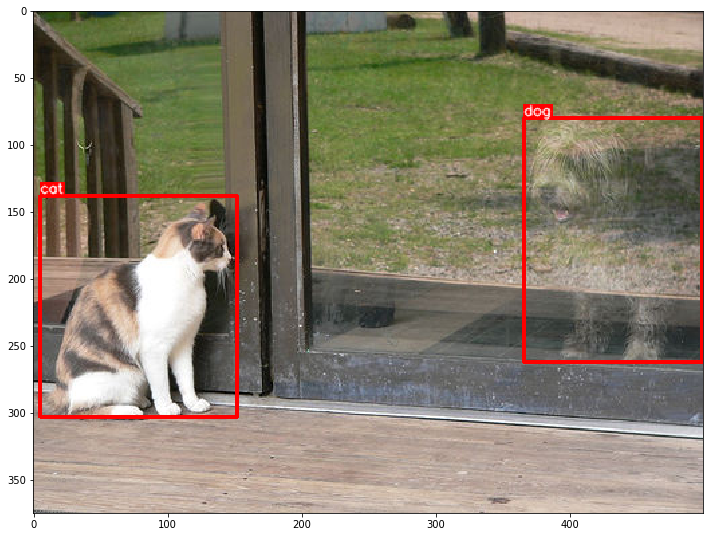

In [62]:
visualize(annotations, category_id_to_name)

#### 自作データのアノテーション情報をvisualizeする

In [63]:
import io

def download_local_image(url):
    pil_im = Image.open(url)
    b = io.BytesIO()
    pil_im.save(b, 'jpeg')
    data = b.getvalue()
    data = np.frombuffer(data, np.uint8)
    image = cv2.imdecode(data, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    return image

In [64]:
def visualizer(annotations_info, category_id_to_name):
    
    
    for i in range(len(annotations_info)):
        annot = annotations_info[i]
        path = annot["path"]
        image = download_local_image(path)
        
        bboxes = []
        for i in range(len(annot["bboxes"])):
            if i == 0:
                x_min = annot["bboxes"][i]
                bboxes.append(x_min)
            elif i == 1:
                y_min = annot["bboxes"][i]
                bboxes.append(y_min)
            elif i == 2:
                w = annot["bboxes"][i] - annot["bboxes"][0]
                bboxes.append(w)
            elif i == 3:
                h = annot["bboxes"][i] - annot["bboxes"][1]
                bboxes.append(h)
        
        annotations = {"image": image, "bboxes":[bboxes], "category_id":[annot["category_id"]]}
        visualize(annotations, category_id_to_name)
    

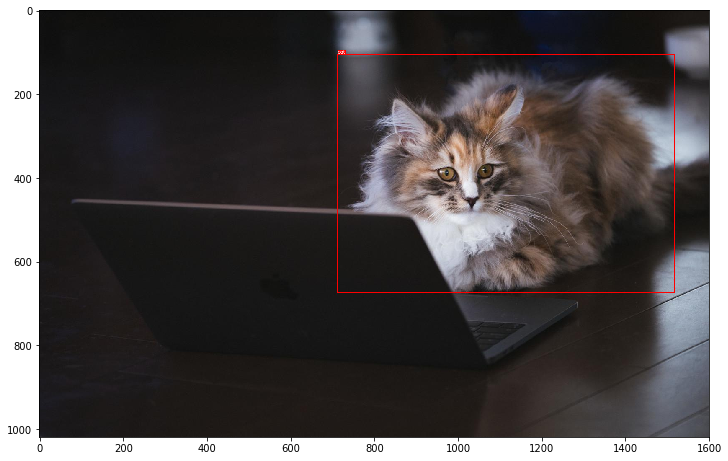

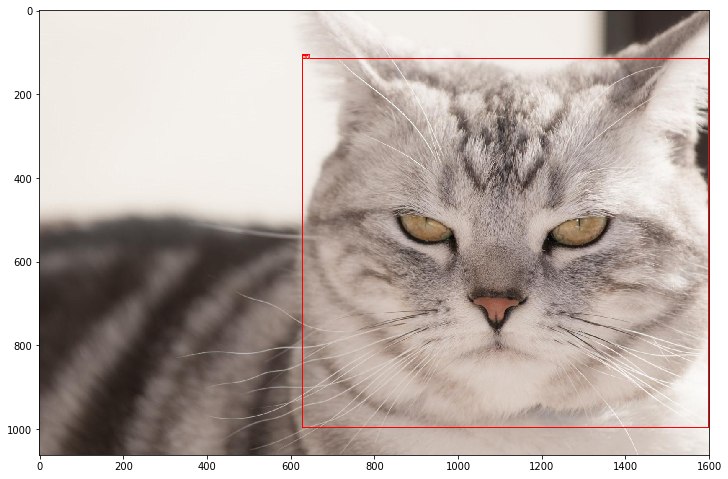

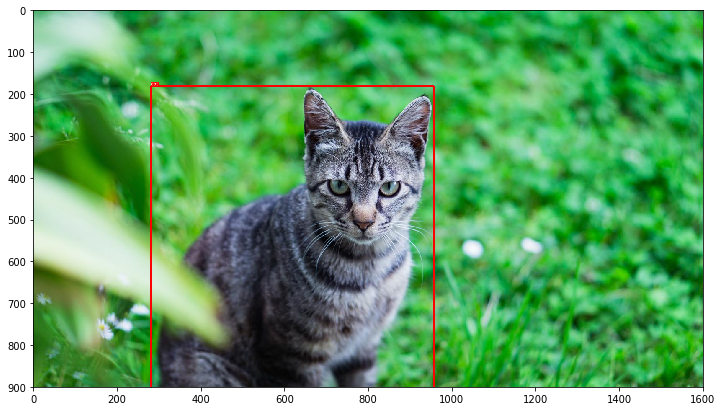

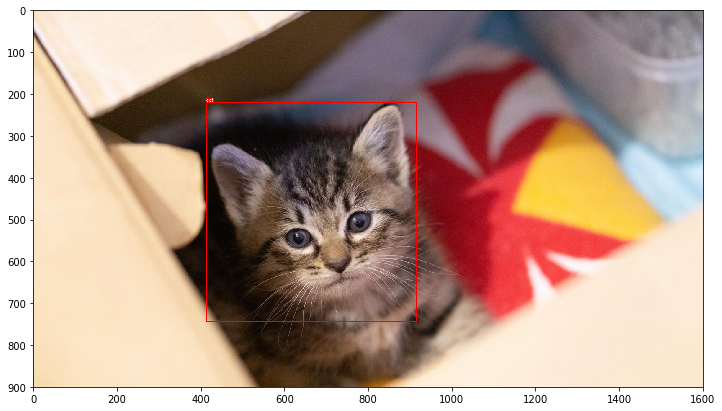

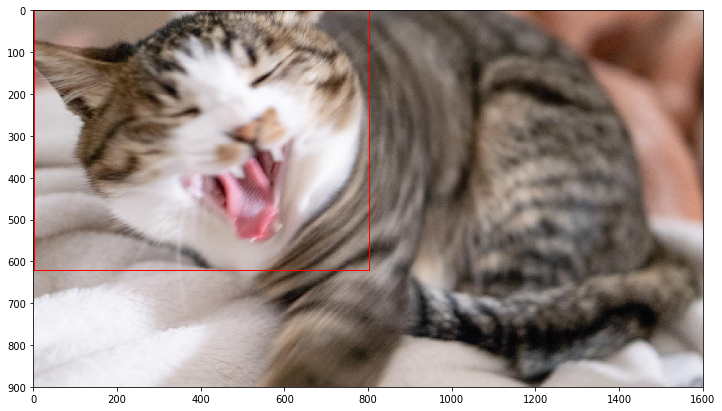

...

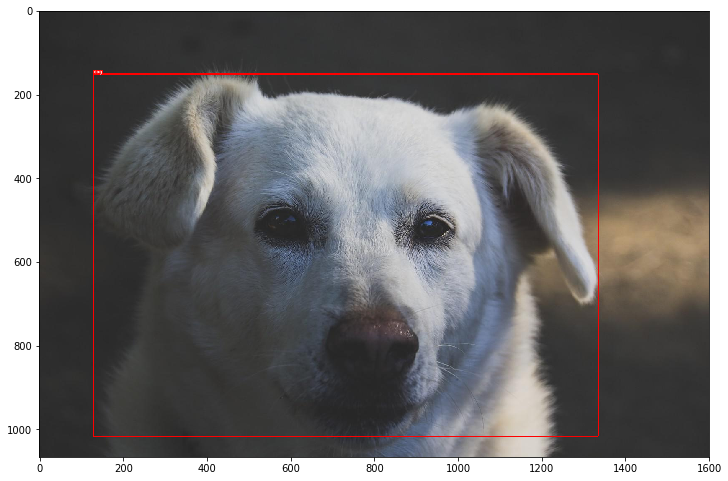

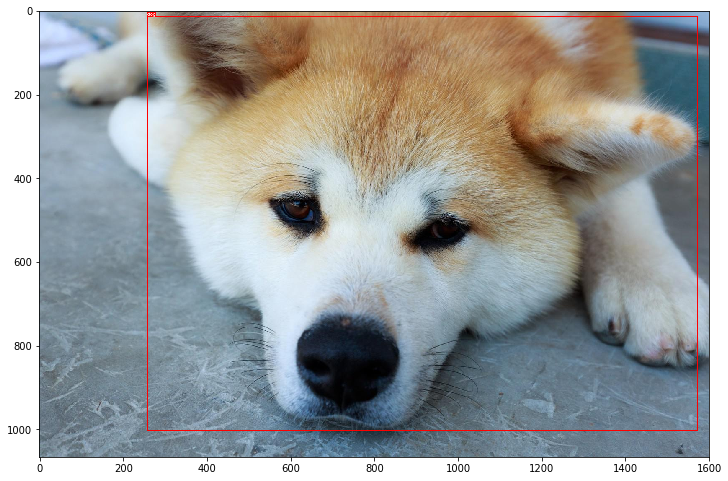

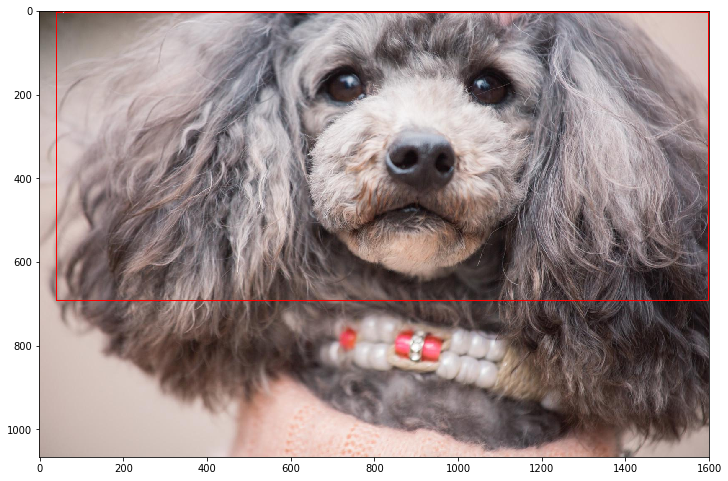

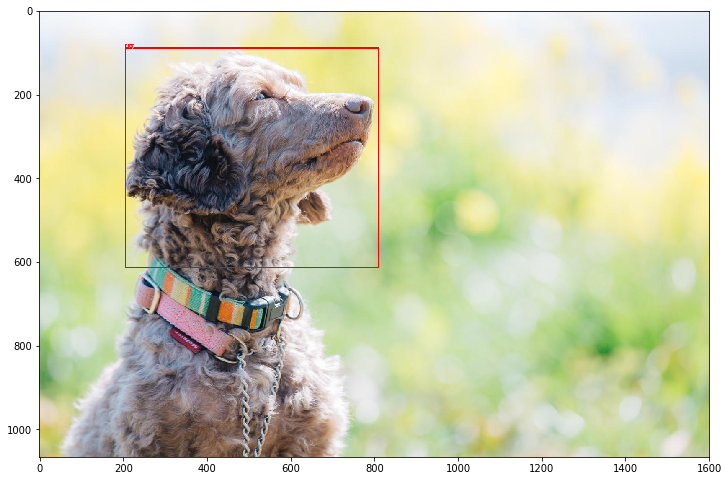

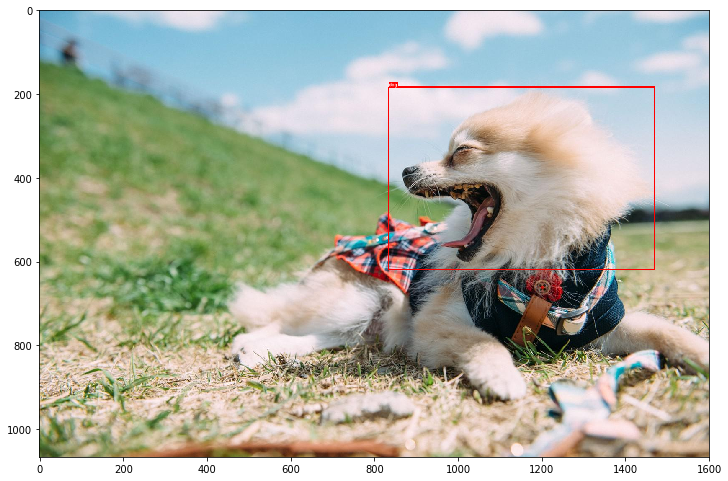

In [65]:
category_id_to_name = {0: 'cat', 1: 'dog'}

visualizer(annotations_info, category_id_to_name)

クラスの表示サイズが小さいものの、アノテーションしたとおりにバウンディングボックスを表示できている。

## Take away

- データ拡張は適切に行うことで、モデルの汎化性能を高める効果がある。

- 但し、実際のタスクに応じて、データ拡張の手法やパラメータを選択、調整する必要がある。
    - 例えば、暗い場所で物体検知を行う場合には、データ拡張において明暗調整を行う必要がある。
    - 検知する物体が動く場合は、データ拡張の際にサイズや角度を変更することが有用と思われる。

- 今回用いたアノテーションツール（LabelImg）は、直感的に操作できるので、機械学習の知識がない人にも作業を任せることができるかもしれない。

- アノテーションの効率化、自動化手法についても調査したい。